In [1]:
import numpy as np
from qutip import *
import matplotlib.pyplot as plt

In [2]:
from ipywidgets import interact

In [3]:
import matplotlib as mpl
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['animation.embed_limit'] = 100

In [4]:
from ipywidgets import IntProgress
from IPython.display import display
from time import time

In [5]:
def make_wigner_animation(wigners):
    f = IntProgress(min=0, max=len(wigners)-1) # instantiate the bar
    wig = wigners[0]
    wlim= abs(wig).max()
    fig = plt.figure()
    ax_image = plt.imshow(wig,cmap='RdBu', norm=mpl.colors.Normalize(-wlim, wlim))
    def update(n):
        if (n == 1):
            print("Generating animation")
            display(f) # display the bar
        ax_image.set_data(wigners[n])
        f.value = n
    anim = animation.FuncAnimation(fig, update, frames=len(wigners))
    plt.close(fig)
    return anim

In [6]:
def make_winger_functions(states):
    print("Making wigner functions")
    x = np.linspace(-5,5,50)
    wigners = []
    f = IntProgress(min=0, max=len(states)-1) # instantiate the bar
    display(f) # display the bar
    for i in range(len(states)):
        wigners.append(wigner(states[i],x,x))
        f.value=i
    print()
    return wigners

# Kerr oscillator with driving and no damping

We are in the rotating frame. 

I think this results in $a^\dagger a^\dagger a a$ without, as I understand, the RWA? 

I need to ask Mario

In [7]:
N = 20
a = destroy(N)
x = a+a.dag()
n = a.dag()*a

## Weak driving to strong driving

eps = 0.1: Rabi oscillations that start to leave the 0-1 manifold

eps = 1.1: an extra "ball" at the bottom that tries to push in but doesn't quite make it

eps = 5: a spinning cat with 3 fringes with another ball that tries to "break into the dance"

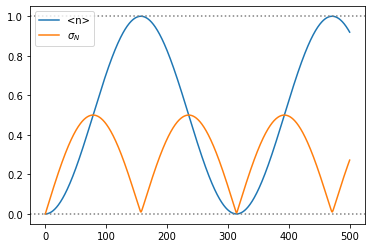

In [22]:
# Ha! we are in the rotating frame

eps = 0.01
H = a.dag()*a.dag()*a*a + 1j*eps*(a.dag()-a)
psi0 = basis(N,0)
t = np.linspace(0,5/eps,1000)
res = mesolve(H, psi0, t, [])
s = res.states
plt.plot(t,expect(n,s), label="<n>")
plt.plot(t,np.sqrt(expect(n**2,s)-expect(n,s)**2), label="$\sigma_N$")
plt.legend()
plt.axhline(1,ls=':',c='grey')
plt.axhline(0,ls=':',c='grey')

Rabi oscillation! Note that although the excitation number looks like it does not really exceed 1, we can see from the uncertainty in n that we are actually having leakage already out of the 0-1 manifold. 

In [23]:
wigners = make_winger_functions(res.states)
anim = make_wigner_animation(wigners)

Making wigner functions


IntProgress(value=0, max=999)

In [24]:
anim

Generating animation


IntProgress(value=0, max=999)

## What are the eigenstates? 

Start with eps = 0.

In [25]:
eps = 0
H = a.dag()*a.dag()*a*a + 1j*eps*(a.dag()-a)
vals, vecs = H.eigenstates()

wigners = make_winger_functions(vecs)
anim = make_wigner_animation(wigners)
anim

Making wigner functions


IntProgress(value=0, max=19)


Generating animation


IntProgress(value=0, max=19)

Interesting. They are not so different from Fock states qualitatively.

Now try eps = 0.1:

In [26]:
eps = 0.1
H = a.dag()*a.dag()*a*a + 1j*eps*(a.dag()-a)
vals, vecs = H.eigenstates()

wigners = make_winger_functions(vecs)
anim = make_wigner_animation(wigners)
anim

Making wigner functions


IntProgress(value=0, max=19)


Generating animation


IntProgress(value=0, max=19)

Cool!

In [ ]:
eps = 0.8
H = a.dag()*a.dag()*a*a + 1j*eps*(a.dag()-a)
vals, vecs = H.eigenstates()

wigners = make_winger_functions(vecs)
anim = make_wigner_animation(wigners)
anim

In [ ]:
eps = 5
H = a.dag()*a.dag()*a*a + 1j*eps*(a.dag()-a)
vals, vecs = H.eigenstates()

wigners = make_winger_functions(vecs)
anim = make_wigner_animation(wigners)
anim

## Try x driving

In [51]:
# Ha! we are in the rotating frame

eps = 0.0

In [52]:
H = a.dag()*a.dag()*a*a + eps*(a.dag()+a)
psi0 = basis(N,0)
t = np.linspace(0,5/eps,1000)
res = mesolve(H, psi0, t, [])
s = res.states
plt.plot(t,expect(n,s), label="<n>")
plt.plot(t,np.sqrt(expect(n**2,s)-expect(n,s)**2), label="$\sigma_N$")
plt.legend()
plt.axhline(1,ls=':',c='grey')
plt.axhline(0,ls=':',c='grey')

ZeroDivisionError: float division by zero

In [53]:
H = a.dag()*a.dag()*a*a + eps*(a.dag()+a)
vals, vecs = H.eigenstates()

wigners = make_winger_functions(vecs)
anim = make_wigner_animation(wigners)
anim

Making wigner functions


IntProgress(value=0, max=19)


Generating animation


IntProgress(value=0, max=19)

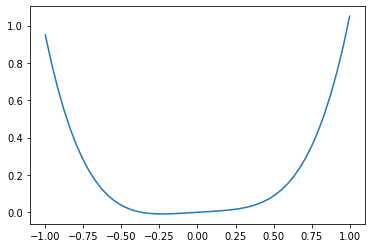

In [54]:
x = np.linspace(-1,1)
v = x**4 + 0.05*x
plt.plot(x,v)

In [55]:
vals[0]

0.0

In [56]:
vals[1]

0.0

Difference in energy between 0 and 1 eigenstates of this potential is the Rabi frequency